**Ход исследования**:
1. Обзор данных.
2. Предобработка данных.
3. Анализ данных.
4. Детализация исследования: открытие кофейни

## Обзор данных

In [22]:
# импорт библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
from numpy import median
from folium import Map, Choropleth
from folium.plugins import MarkerCluster
from folium import Marker
from math import radians, cos, sin, asin, sqrt

In [23]:
# чтение файла с данными
df = pd.read_csv('moscow_places.csv')

# просмотр файла с данными
display(df.head())
df.info()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Выводы**

Рассмотрены данные:
* в датасете представлена информация о **8 406** заведениях;
* столбцы `name`, `category`, `address`, `district`, `hours`, `price`, `avg_bill` хранят значения типа `object`;
* столбцы `lat`, `lng`, `rating`, `middle_avg_bill`, `middle_coffee_cup`, `chain`, `seats` хранят значения числового типа.

## Предобработка данных

Проверим дубликаты в данных и удалим при наличии.

In [24]:
print('Кол-во дубликатов:', df.duplicated().sum())
df = df.drop_duplicates().reset_index(drop=True)

Кол-во дубликатов: 0


Также произведем проверку на наличие дубликатов в столбцах `name` и `address`.

In [25]:
print('Кол-во дубликатов:', df.duplicated(subset=['name', 'address']).sum())

Кол-во дубликатов: 0


Посмотрим на пропуски в данных.

In [26]:
# процент пропусков в данных
round(df.isna().mean() * 100, 1)

name                  0.0
category              0.0
address               0.0
district              0.0
hours                 6.4
lat                   0.0
lng                   0.0
rating                0.0
price                60.6
avg_bill             54.6
middle_avg_bill      62.5
middle_coffee_cup    93.6
chain                 0.0
seats                43.0
dtype: float64

Как видим, **есть пропуски в столбцах** - `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_cofee_cup`, `seats`.  

Данные пропуски оставим как есть, так как отсутствует возможность предложить логичную замену пропущенным данным.
***

### Создание столбца `street`

Создадим столбец `street` с названиями улиц из столбца с адресом:

In [27]:
# создание столбца street
df['street'] = df['address'].str.split(', ', expand=True)[1]
# проверка
df[['address', 'street']].sample(5, random_state=1)

,address,street
1615,"Москва, 4-й Вятский переулок, 10",4-й Вятский переулок
6204,"Москва, Ленинский проспект, 65, корп. 3",Ленинский проспект
89,"Москва, Дмитровское шоссе, 107А, корп. 2",Дмитровское шоссе
307,"Москва, Фестивальная улица, 4А, стр. 1",Фестивальная улица
1079,"Москва, Сельскохозяйственная улица, 38, корп. 2",Сельскохозяйственная улица


### Создание столбца `is_24/7`

Создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

In [28]:
# определим функцию поиска значений "ежедневно" и "круглосуточно" в столбце `hours`
def is_around_the_clock(hours):
    return hours.find('ежедневно') != -1 and hours.find('круглосуточно') != -1
# создадим столбец is_24/7
df['is_24/7'] = df['hours'].fillna('Нет данных').str.lower().apply(is_around_the_clock)
# проверка
display(df[['hours', 'is_24/7']].tail(5))
df['is_24/7'].value_counts().to_frame()

,hours,is_24/7
8401,"ежедневно, 09:00–02:00",False
8402,"ежедневно, 08:00–22:00",False
8403,"ежедневно, круглосуточно",True
8404,"ежедневно, круглосуточно",True
8405,"ежедневно, круглосуточно",True


,is_24/7
False,7676
True,730


***
**Выводы**

Произведена предобработка данных:
* выявлено отсутствие дубликатов в данных;
* выявлено наличие пропусков в столбцах - `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_cofee_cup`, `seats`, пропуски оставлены без заполнения;
* создан столбец `street` с названиями улиц;
* создан столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно, определено кол-во таких заведений - **730**. 

## Анализ данных

### Категории заведений

Рассмотрим какие категории заведений представлены в данных и определим количество объектов общественного питания по категориям.

In [29]:
category = df.groupby('category').agg({'name':'count'}).sort_values(by='name', ascending=False).reset_index()
category

,category,name
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


Построим визуализацию.

In [30]:
# построение столбчатой диаграммы
fig = px.bar(category, 
             x='category', 
             y='name',
             color='category',
             color_discrete_sequence=px.colors.qualitative.Pastel)
fig.update_layout(title='Количество заведений по категориям',
                  xaxis_title='Категории заведений',
                  yaxis_title='Количество заведений',
                  width=800,
                  height=500)
fig.show()

Из диаграммы видно, что более половины заведений, представленных в данных, являются кафе или рестораном, чуть меньшую долю занимают кофейни. Наименьшее число заведений в категориях - "булочная" и "столовая".
***

### Количество посадочных мест в заведениях

Исследуем количество посадочных мест в заведениях по категориям. 
Определим медиану количества посадочных мест и количество заведений, учитывая большое количество пропусков в столбце `seats` (43 %).

In [31]:
seats = df.groupby('category').agg({'seats':['median', 'count']}).reset_index()
seats.columns = ['_'.join(col) for col in seats.columns.values]
seats = (seats.rename(columns={'category_':'category'})
         .sort_values(by='seats_median', ascending=False))
seats

,category,seats_median,seats_count
6,ресторан,86.0,1270
0,"бар,паб",82.5,468
4,кофейня,80.0,751
7,столовая,75.5,164
2,быстрое питание,65.0,349
3,кафе,60.0,1218
5,пиццерия,55.0,427
1,булочная,50.0,148


Построим визуализацию.

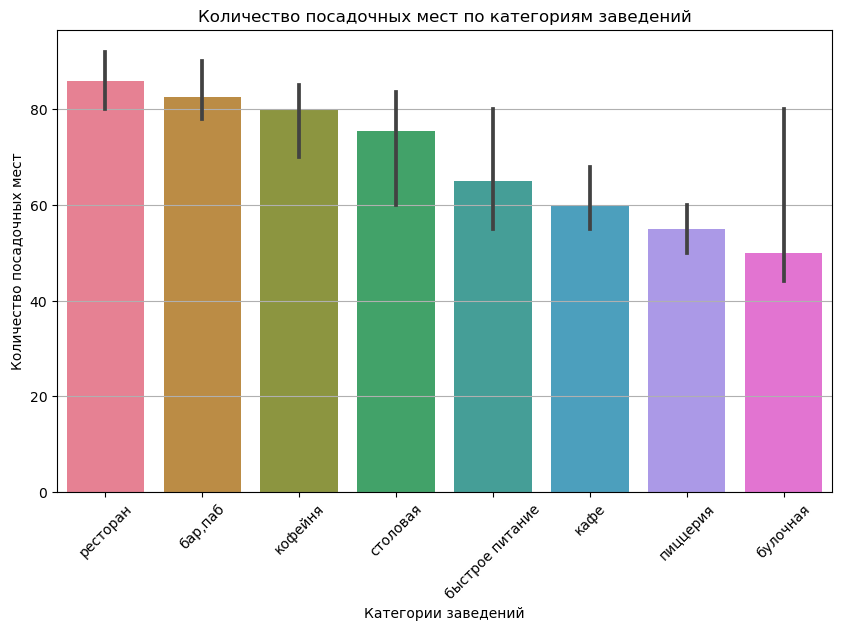

In [32]:
# построение столбчатой диаграммы
plt.figure(figsize=(10, 6))
sns.barplot(x='category', y='seats', 
            data=df, palette='husl', 
            estimator=median, order=list(seats['category']))
plt.xticks(rotation=45)
plt.title('Количество посадочных мест по категориям заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Количество посадочных мест')
plt.grid(axis='y')
plt.show()

Максимальное количество посадочных мест в ресторанах и в барах, пабах. Минимальное - в пиццериях и булочных.  
***

### Соотношение сетевых и несетевых заведений

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

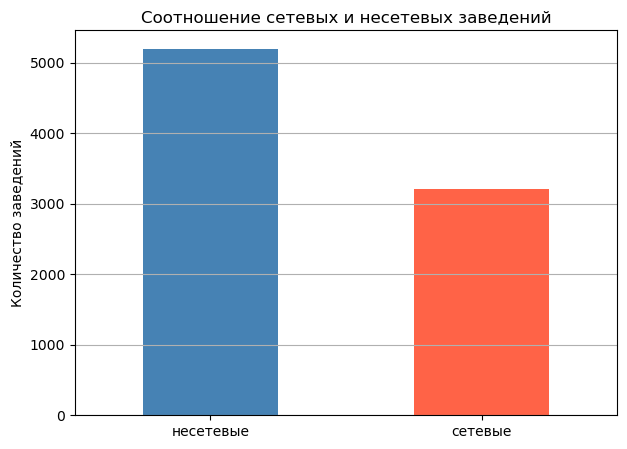

In [33]:
# подготовка таблицы
chain = (df.groupby('chain').agg({'name':'count'})
         .rename(columns={'name':'count'}).reset_index()
         .replace({0: 'несетевые', 1: 'сетевые'}))
# построение гистограммы
chain.plot(kind='bar', y='count', x='chain',
           title='Соотношение сетевых и несетевых заведений', 
           ylabel='Количество заведений', xlabel='', color=['steelblue', 'tomato'],
           legend=False, figsize= (7, 5), rot=0).grid(axis='y');

В датасете более, чем в 1,5 раза больше несетевых заведений, чем сетевых.
***

### Сетевые заведения

Определим какие категории заведений чаще являются сетевыми.

In [34]:
# подготовка таблицы
chain_category = (df.replace({'chain': {0: 'несетевые', 1: 'сетевые'}})
                    .pivot_table(columns='category', index='chain', values='name', aggfunc='count'))
chain_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
chain,,,,,,,,
несетевые,596,99,371,1599,693,303,1313,227
сетевые,169,157,232,779,720,330,730,88


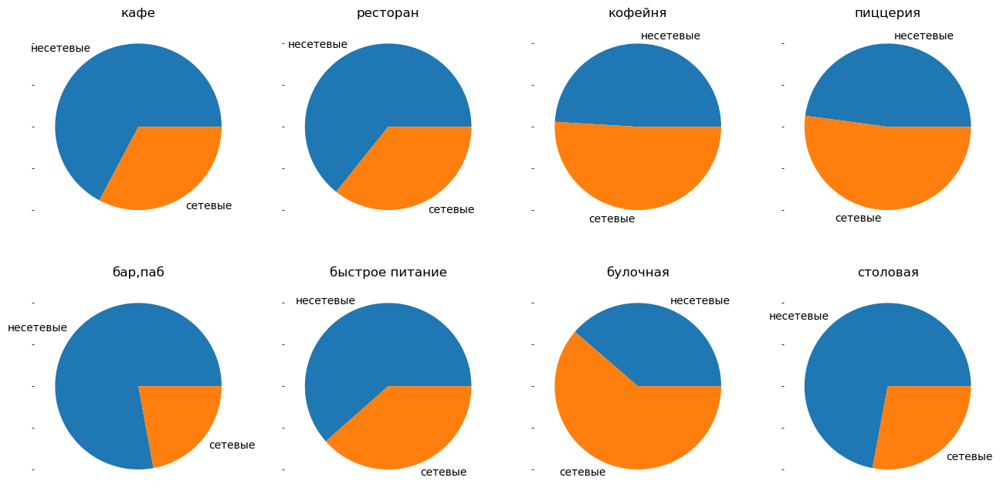

In [35]:
# построение круговых диаграмм
fig, axes = plt.subplots(2, 4, figsize=(16, 8), sharey=True)
axe = axes.ravel()
categories = list(df['category'].unique())
i = 0

for category in categories:
    chain_category.plot(kind='pie', y=category, title=category, ax=axe[i], legend=False, ylabel='')
    i += 1

Как видно из диаграмм, чаще сетевыми являются булочные, пиццерии и кофейни. 
***

### Топ-15 популярных сетей

Найдем топ-15 популярных сетей в Москве.

In [36]:
top_15 = (df.groupby('name').agg({'chain':'sum', 'category':'first'})
                   .rename(columns={'chain':'count'})
                   .sort_values(by='count', ascending=False)
                   .reset_index().head(15))
top_15

,name,count,category
0,Шоколадница,120,кофейня
1,Домино'с Пицца,76,пиццерия
2,Додо Пицца,74,пиццерия
3,One Price Coffee,71,кофейня
4,Яндекс Лавка,69,ресторан
5,Cofix,65,кофейня
6,Prime,50,ресторан
7,Хинкальная,44,быстрое питание
8,КОФЕПОРТ,42,кофейня
9,Кулинарная лавка братьев Караваевых,39,кафе


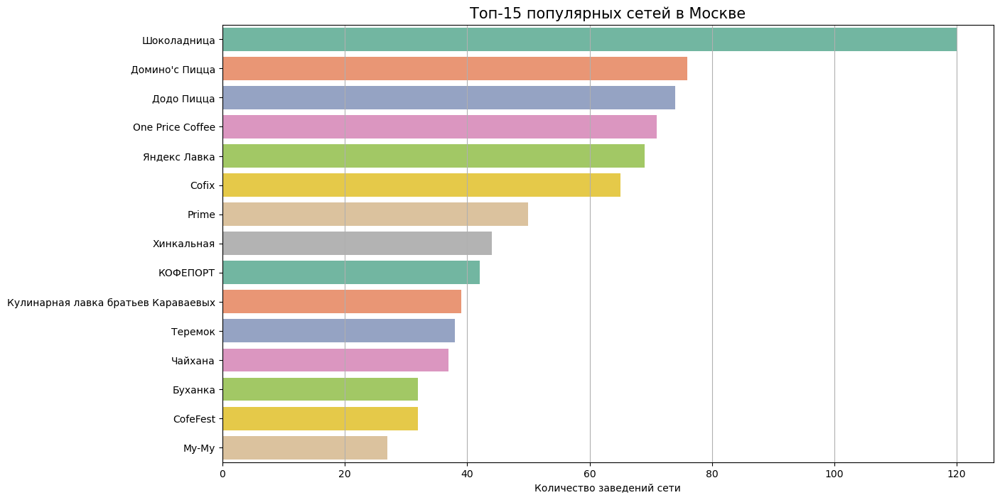

In [37]:
# построение столбчатой диаграммы
plt.figure(figsize=(14, 8))
sns.barplot(x='count', y='name', 
            data=top_15, palette='Set2')
plt.title('Топ-15 популярных сетей в Москве', fontsize=15)
plt.xlabel('Количество заведений сети')
plt.ylabel('')
plt.grid(axis='x')
plt.show()

Рассмотрим топ-15 заведений по категориям.

In [38]:
top_15_by_category = (top_15.groupby('category').agg({'count':'sum'})
                            .sort_values(by='count', ascending=False))
top_15_by_category

,count
category,
кофейня,330
ресторан,157
пиццерия,150
кафе,103
быстрое питание,44
булочная,32


Самой популярной сетью в Москве является кофейня "Шоколадница" и в целом среди заведений топ-15 популярных сетей много кофеен.
***

### Количество заведений по районам Москвы

Рассмотрим какие административные районы Москвы присутствуют в датасете.  

In [39]:
districts_order = (df['district'].value_counts().to_frame()
                                 .reset_index()
                                 .rename(columns={'index':'district', 'district':'count'})
                                 .sort_values(by='count'))
districts_order

,district,count
8,Северо-Западный административный округ,409
7,Юго-Западный административный округ,709
6,Юго-Восточный административный округ,714
5,Восточный административный округ,798
4,Западный административный округ,851
3,Северо-Восточный административный округ,891
2,Южный административный округ,892
1,Северный административный округ,900
0,Центральный административный округ,2242


Отобразим общее количество заведений и количество заведений каждой категории по районам.

In [40]:
# подготовка таблицы
districts = (df.pivot_table(index=['district', 'category'], values='name', aggfunc='count')
               .sort_values(by='name', ascending=False)
               .reset_index())
districts.head()

,district,category,name
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282


In [41]:
# построение диаграммы 
fig = px.bar(districts, 
             x='district', 
             y='name',
             color='category',
             color_discrete_sequence=px.colors.qualitative.Pastel)
fig.update_layout(title='Количество заведений каждой категории по районам',
                  xaxis_title='Районы Москвы',
                  yaxis_title='Количество заведений',
                  xaxis={'categoryorder':'total descending'},
                  width=850,
                  height=650)
fig.show()

***
### Рейтинги заведений по категориям


Визуализируем распределение средних рейтингов по категориям заведений.

In [42]:
# подготовка таблицы
rating = (df.groupby('category').agg({'rating':['mean', 'median']})
            .sort_values(by=('rating', 'mean'), ascending=False)
            .reset_index())
rating

category    rating       
                        mean median
0          бар,паб  4.387712    4.4
1         пиццерия  4.301264    4.3
2         ресторан  4.290357    4.3
3          кофейня  4.277282    4.3
4         булочная  4.268359    4.3
5         столовая  4.211429    4.3
6             кафе  4.123886    4.2
7  быстрое питание  4.050249    4.2

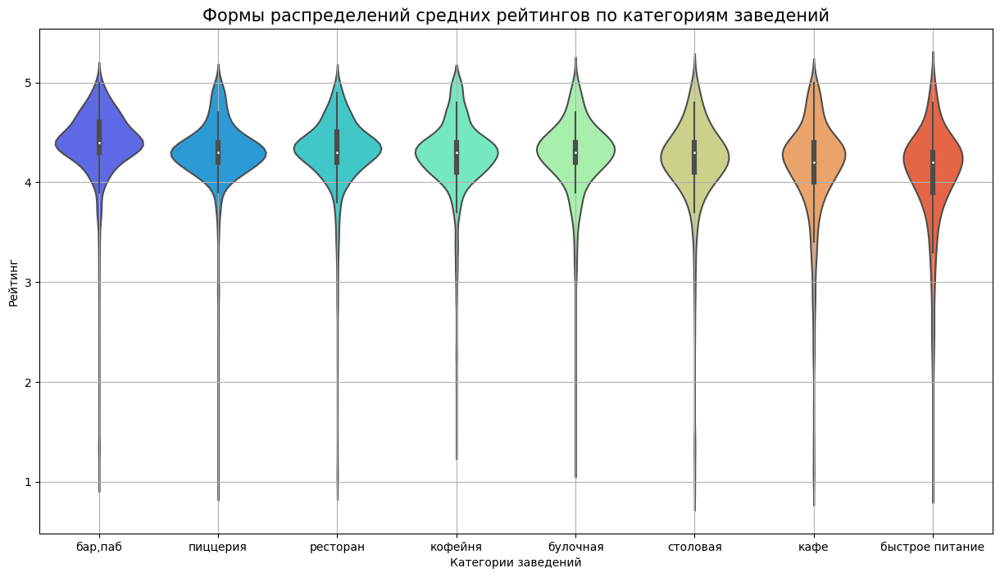

In [43]:
# построение графиков распределения
plt.figure(figsize=(15, 8))
sns.violinplot(x='category', y='rating', data=df, palette='rainbow',
               order=list(rating['category']))
plt.title('Формы распределений средних рейтингов по категориям заведений', fontsize=15)
plt.xlabel('Категории заведений')
plt.ylabel('Рейтинг')
plt.grid()
plt.show()

Усреднённые рейтинги в разных типах общепита различаются не сильно - максимальный у баров и пабов (4,4), минимальный у заведений быстрого питания (4,1).
***

### Фоновая картограмма со средним рейтингом заведений

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [44]:
# подготовка таблицы
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')
rating_df.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


In [74]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.4,
    legend_name='Медианный рейтинг заведений по районам Москвы',
).add_to(m)

# выводим карту
m

***
### Отображение всех заведений на карте с помощью кластеров

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки `folium`.

In [51]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

m

***
### Топ-15 улиц по количеству заведений

Найдем топ-15 улиц по количеству заведений.

In [52]:
top_streets_15 = (df.groupby('street').agg({'name':'count'})
                    .sort_values(by='name', ascending=False)
                    .rename(columns={'name':'count'})
                    .reset_index().head(15))
top_streets_15

,street,count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


Построим график распределения количества заведений и их категорий по этим улицам.

In [53]:
# подготовка таблицы
top_streets_category = (df.query('street in @top_streets_15.street')
                          .pivot_table(index=['street', 'category'], values='name', aggfunc='count')
                          .sort_values(by='street')
                          .rename(columns={'name':'count'})
                          .reset_index())
top_streets_category.head()

,street,category,count
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4


In [54]:
# построение диаграммы 
fig = px.bar(top_streets_category, 
             x='street', 
             y='count',
             color='category',
             color_discrete_sequence=px.colors.qualitative.Set2)
fig.update_layout(title='Количество заведений каждой категории в топ-15 улиц по числу заведений',
                  xaxis_title='Названия улиц',
                  yaxis_title='Количество заведений',
                  xaxis={'categoryorder':'array', 'categoryarray':list(top_streets_15['street'])},
                  height=650,
                  annotations=[{"x": x, "y": total * 1.05, "text": str(total), "showarrow": False}
                  for x, total in (top_streets_category.groupby('street', as_index=False)
                                                       .agg({'count': 'sum'}).values)])
fig.show()

***
### Улицы, на которых находится одно заведение

Найдем улицы, на которых находится только один объект общепита.

In [55]:
streets = df.groupby('street').agg({'name':'count'}).query('name == 1').reset_index()
streets.head(5)

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
4,1-й Голутвинский переулок,1


In [56]:
# рассмотрим категории данных объектов общепита
(df.query('street in @streets.street').groupby('category').agg({'name':'count'})
   .sort_values(by='name', ascending=False))

,name
category,
кафе,160
ресторан,93
кофейня,84
"бар,паб",39
столовая,36
быстрое питание,23
пиццерия,15
булочная,8


In [57]:
# отобразим данные объекты общепита на карте
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['street']}",
    ).add_to(marker_cluster)

df.query('street in @streets.street').apply(create_clusters, axis=1)

m

Найденные заведения, которые расположены на улицах, на которых находится только один объект общепита, являются заведениями разных категорий, разных округов, разной ценовой категории, но данные заведения в основном расположены на небольших улицах, переулках или проездах. 
***

### Фоновая картограмма со средним чеком заведений

Посчитаем медиану столбца `middle_avg_bill` для каждого района.

In [58]:
bill = (df.groupby('district').agg({'middle_avg_bill':['median','count']})
                              .sort_values(by=('middle_avg_bill', 'median'), ascending=False)
                              .reset_index())
bill.columns = ['_'.join(col) for col in bill.columns.values]
bill = bill.rename(columns={'district_':'district',
                            'middle_avg_bill_median': 'median_bill',
                            'middle_avg_bill_count':'count'})
bill

,district,median_bill,count
0,Западный административный округ,1000.0,306
1,Центральный административный округ,1000.0,1060
2,Северо-Западный административный округ,700.0,157
3,Северный административный округ,650.0,322
4,Юго-Западный административный округ,600.0,235
5,Восточный административный округ,575.0,260
6,Северо-Восточный административный округ,500.0,301
7,Южный административный округ,500.0,314
8,Юго-Восточный административный округ,450.0,194


Построим фоновую картограмму с полученными значениями для каждого района.

In [75]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bill,
    columns=['district', 'median_bill'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.4,
    legend_name='Средняя стоимость заказа в рублях по районам Москвы',
).add_to(m)

# выводим карту
m

Рассмотрим данные столбца `middle_avg_bill`.

In [60]:
df['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

Проанализируем цены в разных округах, ограничив средний чек до 10 000 руб. для информативности.

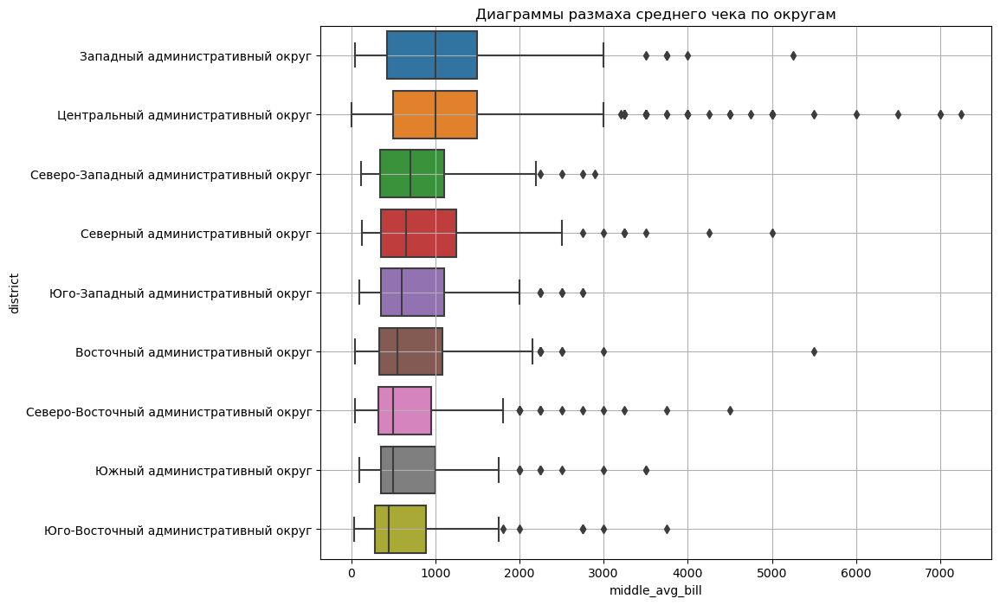

In [61]:
# строим диаграмму размаха
plt.figure(figsize=(10, 8))
ax = sns.boxplot(x='middle_avg_bill', 
                 y='district', 
                 data=df.query('middle_avg_bill < 10000'),
                 order=list(bill['district']))
plt.grid()
plt.title('Диаграммы размаха среднего чека по округам');

Как видим самые дорогие цены в ЦАО и ЗАО, при этом в ЦАО много заведений с аномально высокими средними чеками.  
Самые низкие цены в ЮВАО.

Посмотрим как удалённость от центра влияет на цены в заведениях.  
Для этого определим расстояние от центра до заведений.

In [62]:
# определение функции расчета расстояния от центра до заведений
def haversine(row): 
    lon1, lat1, lon2, lat2 = map(radians, [37.618423, 55.751244, row['lng'], row['lat']])   
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371
    return c * r

# добавление столбца с расстоянием от центра до заведений
df['city_center_nearest'] = df.apply(haversine, axis=1)

Отобразим зависимость цен в заведениях от удаленности от центра.

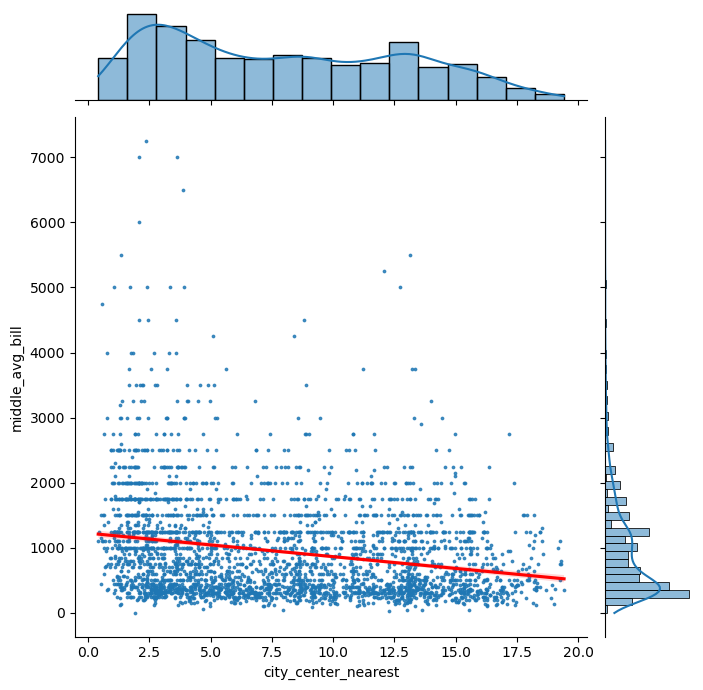

In [63]:
sns.jointplot(x='city_center_nearest', y='middle_avg_bill', 
              data=df.query('middle_avg_bill < 10000'), 
              kind='reg', height=7, scatter_kws={'s': 3},
              joint_kws={'line_kws':{'color':'red'}});

Как видно из графика, цена снижается в зависимости от удаленности от центра.
***

### Зависимость рейтинга от цен в заведении

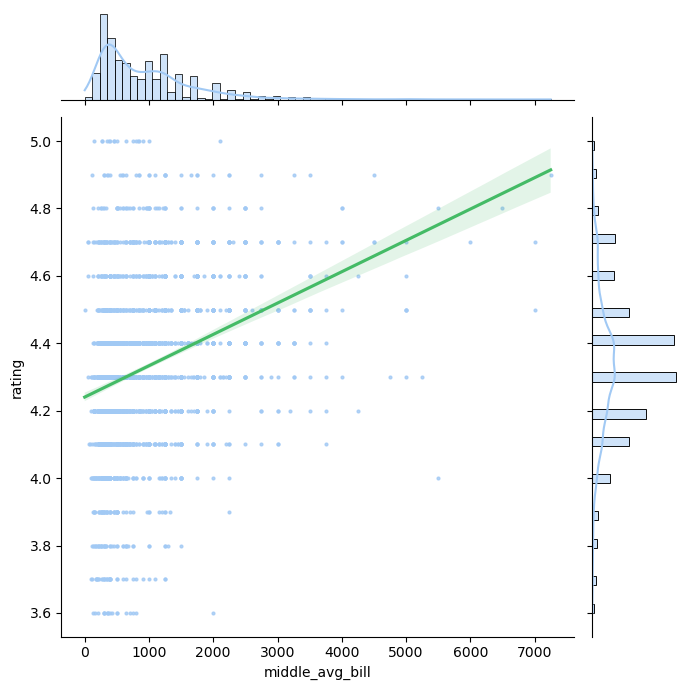

In [64]:
# построение графика
sns.set_palette('pastel') 
sns.jointplot(y='rating', x='middle_avg_bill', 
              data=df.query('middle_avg_bill < 10000 & rating > 3.5'), 
              kind='reg', height=7, scatter_kws={'s': 4},
              joint_kws={'line_kws':{'color':'#44bb66'}});

Наблюдается прямая зависимость рейтинга от цен в заведении - чем дороже средний чек, тем выше рейтинг.

**Выводы**:

Проведен анализ данных, выявлено следующее:
* среди заведений общественного питания больше всех кафе и ресторанов, меньше всего - булочных и столовых;
* максимальное количество посадочных мест в ресторанах и в барах, пабах, минимальное - в пиццериях и булочных;
* несетевых заведений больше, чем сетевых, при этом чаще всего сетевыми являются булочные, пиццерии и кофейни; 
* самой популярной сетью в Москве является кофейня "Шоколадница" и в целом среди заведений топ-15 популярных сетей много кофеен;
* самое большое количество заведений в ЦАО, также в ЦАО наибольший средний рейтинг заведений;
* в среднем максимальный рейтинг у баров и пабов (4,4), минимальный у заведений быстрого питания (4,1);
* определены топ-15 улиц по количеству заведений - на проспекте Мира 184 заведения;
* в данных есть 458 заведений, которые расположены на улицах (как правило это небольшие улицы, переулки или проезды), на которых расположено только одно заведение общественного питания; 
* максимальный средний чек в ЦАО и ЗАО, минимальный - в ЮВАО, при этом чем дальше заведение от центра, тем средняя цена ниже;
* есть прямая зависимость рейтинга от цен в заведении.
***

## Детализация исследования: открытие кофейни

### Количество и расположение кофеен

Определим сколько всего кофеен в датасете.

In [65]:
# кол-во кофеен в датасете
df_coffee = df[df['category'] == 'кофейня']
len(df_coffee)

1413

Рассмотрим в каких районах больше всего кофеен.

In [66]:
# подгтовка таблицы
districts_coffee = (df_coffee.groupby('district').agg({'name':'count'})
                             .sort_values(by='name', ascending=False))
districts_coffee

,name
district,
Центральный административный округ,428
Северный административный округ,193
Северо-Восточный административный округ,159
Западный административный округ,150
Южный административный округ,131
Восточный административный округ,105
Юго-Западный административный округ,96
Юго-Восточный административный округ,89
Северо-Западный административный округ,62


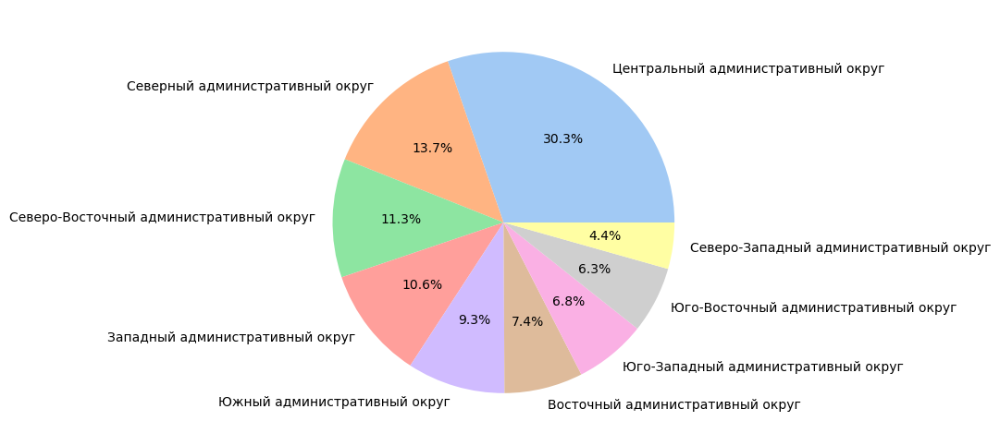

In [67]:
districts_coffee.plot(kind='pie', y='name', 
                      legend=False, ylabel='', autopct='%1.1f%%',
                      figsize=(6, 6));

В основном кофейни расположены в ЦАО.
***

### Круглосуточные кофейни

Выявим есть ли круглосуточные кофейни, определим их количество и отобразим на карте.

In [68]:
len(df_coffee[df_coffee['is_24/7'] == True])

59

In [69]:
# отобразим данные объекты общепита на карте
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

df_coffee[df_coffee['is_24/7'] == True].apply(create_marker, axis=1)

m

In [70]:
# кол-во круглосуточных кофеен по районам
(df_coffee[df_coffee['is_24/7'] == True].groupby('district').agg({'name':'count'})
                                        .sort_values(by='name', ascending=False))

,name
district,
Центральный административный округ,26
Западный административный округ,9
Юго-Западный административный округ,7
Восточный административный округ,5
Северный административный округ,5
Северо-Восточный административный округ,3
Северо-Западный административный округ,2
Юго-Восточный административный округ,1
Южный административный округ,1


***

### Рейтинги кофеен

In [71]:
# подготовка таблицы
rating_df_coffee = df_coffee.groupby('district', as_index=False)['rating'].agg('mean')
rating_df_coffee.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [76]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df_coffee,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.3,
    legend_name='Средний рейтинг кофеен по районам Москвы',
).add_to(m)

# выводим карту
m

Рейтинги кофеен по районам в целом распределены равномерно, незначительное отклонение в меньшую сторону по ЗАО и СВАО.
***

### Стоимость чашки капучино

Рассмотрим медианную стоимость чашки капучино по районам.

In [73]:
(df_coffee.groupby('district').agg({'middle_coffee_cup':'median'})
          .sort_values(by='middle_coffee_cup', ascending=False))

,middle_coffee_cup
district,
Юго-Западный административный округ,198.0
Центральный административный округ,190.0
Западный административный округ,189.0
Северо-Западный административный округ,165.0
Северо-Восточный административный округ,162.5
Северный административный округ,159.0
Южный административный округ,150.0
Юго-Восточный административный округ,147.5
Восточный административный округ,135.0


Учитывая, что медианная стоимость чашки капучино во всех районах составляет менее 200 рублей, при открытии кофейни следует ориентироваться на стоимость чашки капучино менее 200 рублей.
***

### Рекомендации для открытия новой кофейни

По результатам анализа датасета с заведениями общественного питания Москвы для открытия новой доступной кофейни в Москве предлагаются следующие рекомендации:
* Учитывая наибольшую проходимость и большую стоимость чашки капучино **новую кофейню следует открыть в ЦАО**;
* Рассмотреть возможность открыть кофейню на Профсоюзной улице или на проспекте Вернадского, так как указанные улицы являются популярными (по кол-ву заведений), но где не очень много кофеен; 
* Так как в Москве небольшое количество круглосуточных кофеен, предлагается **открыть кофейню с круглосуточным режимом работы**.